In [56]:
"""
from postman, cell below is slightly modified for brevity
"""
import requests
url= "http://127.0.0.1:8000/"
test_image_path = r'C:\Users\sauce\OneDrive\Desktop\ml thread segmentation\1694_test_image.bmp'
payload={}
files=[
    ('data', ('testimg.jpg', open(test_image_path, 'rb'), 'image/bmp'))
]
headers = {
    'accept': 'application/json'
}

response = requests.request("POST", url, headers=headers, data=payload, files=files)

#print(response.text)

In [57]:
import cv2
import json
from matplotlib import pyplot as plt

"response is encapsulated in a string, so we need to decode it"

prediction = json.loads(response.text)

yhat = json.loads(prediction['prediction'])

In [58]:
#yhat

In [59]:
"""add np array wrapper, add thresholding """

import numpy as np
yhat = np.array(json.loads(prediction['prediction']))
#yhat = np.where(yhat > 0.3, 1.0, 0.0)

np.shape(yhat)

(1, 256, 256, 7)

In [60]:
x = cv2.imread(test_image_path)
# squeeze prediction
yhat = np.array(json.loads(prediction['prediction']))

#yhat = np.squeeze(np.where(yhat > 0.3, 1.0, 0.0))
yhat = np.squeeze(yhat)

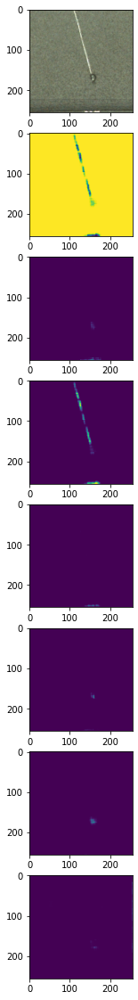

In [63]:
fig, ax = plt.subplots(8,1, figsize=(20,20))
ax[0].imshow(x)
for i in range(7):
    ax[i+1].imshow(yhat[:,:,i])

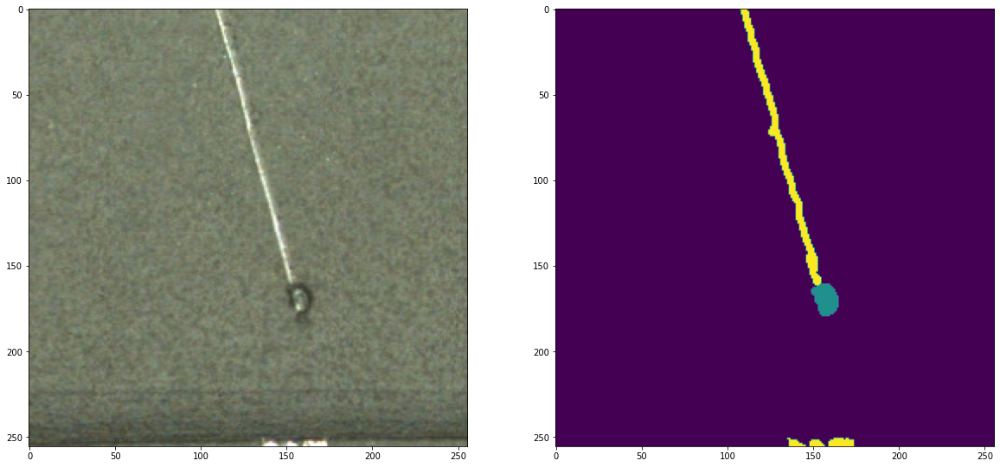

In [62]:
test_label_path = r'C:\Users\sauce\OneDrive\Desktop\ml thread segmentation\1694_test_mask.bmp'

fig, ax = plt.subplots(1,2, figsize=(20,10))
ax[0].imshow(x)
label = cv2.imread(test_label_path)

gray = cv2.cvtColor(label, cv2.COLOR_BGR2GRAY)

ax[1].imshow(gray)
plt.show()


In [8]:
# another shot at interpreting pred

from model_definition import SegmentationModel

model_class = SegmentationModel().model
model_class.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 128, 128, 32  896         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 128, 128, 32  128        ['conv2d[0][0]']                 
 alization)                     )                                                             

 add_2 (Add)                    (None, 16, 16, 256)  0           ['max_pooling2d_2[0][0]',        
                                                                  'conv2d_3[0][0]']               
                                                                                                  
 activation_7 (Activation)      (None, 16, 16, 256)  0           ['add_2[0][0]']                  
                                                                                                  
 conv2d_transpose (Conv2DTransp  (None, 16, 16, 256)  590080     ['activation_7[0][0]']           
 ose)                                                                                             
                                                                                                  
 batch_normalization_7 (BatchNo  (None, 16, 16, 256)  1024       ['conv2d_transpose[0][0]']       
 rmalization)                                                                                     
          

                                                                                                  
 conv2d_transpose_6 (Conv2DTran  (None, 128, 128, 32  18464      ['activation_13[0][0]']          
 spose)                         )                                                                 
                                                                                                  
 batch_normalization_13 (BatchN  (None, 128, 128, 32  128        ['conv2d_transpose_6[0][0]']     
 ormalization)                  )                                                                 
                                                                                                  
 activation_14 (Activation)     (None, 128, 128, 32  0           ['batch_normalization_13[0][0]'] 
                                )                                                                 
                                                                                                  
 conv2d_tr

In [22]:
#model.load_weights('UNET_256x256_20nov_2022_final_weights.h5')
#model_class.load_weights("UNET_256x256_15dec_2022.h5")

model_class = tf.keras.models.load_model("UNET_256x256_15dec_2022.h5")

#model_class.summary()

In [17]:
x = cv2.imread(test_image_path)
x_img = np.reshape(x, (-1,256,256,3))
y_pred_s = model_class.predict(x_img)
print(np.shape(y_pred_s))

1/1 [==============================] - 0s 327ms/step
(1, 256, 256, 7)


In [23]:
import tensorflow as tf

def create_mask(pred_mask):
    pred_mask = tf.math.argmax(pred_mask, axis=-1)
    pred_mask = pred_mask[..., tf.newaxis]
    return pred_mask[0]

print(np.shape(create_mask(y_pred_s)))
print('min', np.min(create_mask(y_pred_s)))
print('max', np.max(create_mask(y_pred_s)))

(256, 256, 1)
min 2
max 6


shape of original label (256, 256, 3)
shape of original grey (256, 256)
shape of y-pre-s (1, 256, 256, 7)
shape of pred_mask (256, 256, 1)
shape of p_m_r (256, 256)
(256, 256)
min p_m_r 2
max p_m_r 6
shape of new_arr (256, 256)
min new_arr 0
max new_arr 255


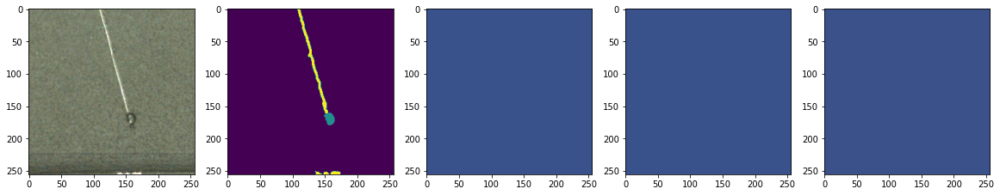

In [40]:
fig, ax = plt.subplots(1,5, figsize=(20,10))

label = cv2.imread(test_label_path)

print('shape of original label', np.shape(label))
gray = cv2.cvtColor(label, cv2.COLOR_BGR2GRAY)
print('shape of original grey', np.shape(gray))

print('shape of y-pre-s', np.shape(y_pred_s))


y_pred_s = np.where(y_pred_s > 0.3, 1.0, 0.0)

pred_mask = create_mask(y_pred_s)
print('shape of pred_mask', np.shape(pred_mask))

p_m_r = np.reshape(pred_mask, (256,256))
print('shape of p_m_r', np.shape(p_m_r))

_yhat = np.array(json.loads(prediction['prediction']))

print(np.shape(p_m_r))
print('min p_m_r', np.min(p_m_r))
print('max p_m_r', np.max(p_m_r))

new_arr = ((p_m_r - p_m_r.min()) * (1/(p_m_r.max() - p_m_r.min()) * 255)).astype('uint8')

print('shape of new_arr', np.shape(new_arr))
print('min new_arr', np.min(new_arr))
print('max new_arr', np.max(new_arr))

ax[0].imshow(x)
ax[1].imshow(gray)
ax[2].imshow(pred_mask)
ax[3].imshow(p_m_r)
ax[4].imshow(new_arr)

plt.show()

In [41]:
def unet(img_size, num_classes):
    inputs = tf.keras.Input(shape=img_size + (3,))

    ### [First half of the network: downsampling inputs] ###

    # Entry block
    x = layers.Conv2D(32, 3, strides=2, padding="same")(inputs)
    x = layers.BatchNormalization()(x)
    x = layers.Activation("relu")(x)

    previous_block_activation = x  # Set aside residual

    # Blocks 1, 2, 3 are identical apart from the feature depth.
    for filters in [64, 128, 256]:
        x = layers.Activation("relu")(x)
        x = layers.SeparableConv2D(filters, 3, padding="same")(x)
        x = layers.BatchNormalization()(x)

        x = layers.Activation("relu")(x)
        x = layers.SeparableConv2D(filters, 3, padding="same")(x)
        x = layers.BatchNormalization()(x)

        x = layers.MaxPooling2D(3, strides=2, padding="same")(x)

        # Project residual
        residual = layers.Conv2D(filters, 1, strides=2, padding="same")(
            previous_block_activation
        )
        x = layers.add([x, residual])  # Add back residual
        previous_block_activation = x  # Set aside next residual

    ### [Second half of the network: upsampling inputs] ###

    for filters in [256, 128, 64, 32]:
        x = layers.Activation("relu")(x)
        x = layers.Conv2DTranspose(filters, 3, padding="same")(x)
        x = layers.BatchNormalization()(x)

        x = layers.Activation("relu")(x)
        x = layers.Conv2DTranspose(filters, 3, padding="same")(x)
        x = layers.BatchNormalization()(x)

        x = layers.UpSampling2D(2)(x)

        # Project residual
        residual = layers.UpSampling2D(2)(previous_block_activation)
        residual = layers.Conv2D(filters, 1, padding="same")(residual)
        x = layers.add([x, residual])  # Add back residual
        previous_block_activation = x  # Set aside next residual

    # Add a per-pixel classification layer
    outputs = layers.Conv2D(num_classes, 3, activation="softmax", padding="same")(x)

    # Define the model
    model = tf.keras.Model(inputs, outputs)
    return model

n_classes = 7
img_size = (256, 256)

unet_model = unet(img_size, n_classes)
unet_model.summary()

# load weights to model


NameError: name 'layers' is not defined

In [ ]:
unet_model.load_weights("UNET_256x256_15dec_2022.h5")

x = cv2.imread(test_image_path)
x_img = np.reshape(x, (-1,256,256,3))
y_pred_unet = unet_model.predict(x_img)
print('shape of prediction', np.shape(y_pred_unet))

print('shape of maskpred', create_mask(np.shape(y_pred_unet)))

label = cv2.imread(test_label_path)

gray = cv2.cvtColor(label, cv2.COLOR_BGR2GRAY)

_yhat = np.array(json.loads(prediction['prediction']))

fig, ax = plt.subplots(1,4, figsize=(20,10))

ax[0].imshow(x)
ax[1].imshow(gray)
ax[2].imshow(create_mask(y_pred_s))
ax[3].imshow(create_mask(y_pred_unet))
plt.show()

In [47]:
import glob
mask_path = "C:\\Users\\sauce\\OneDrive\\Desktop\\final_images\\masks\\"
image_path = "C:\\Users\\sauce\\OneDrive\\Desktop\\final_images\\images\\"

""
SIZE_X = 256 #512  
SIZE_Y = 256 #512 
num_images = 2500
n_classes=7

In [48]:
"""updated image routine"""

image_names = glob.glob(image_path + "*.bmp")
image_names.sort()
image_names_subset = image_names[0:num_images]
#images = [cv2.imread(image, 0) for image in image_names_subset]

images = []

for image in image_names_subset:
    
    x = cv2.imread(image, cv2.COLOR_RGB2BGR)
    #x_n = x[2:579,13:590,:] # remove border
    #x_f = cv2.resize(x_n, (SIZE_X,SIZE_Y), 3, interpolation=cv2.INTER_NEAREST)
    #images.append(x_f)
    images.append(x)

image_dataset = np.array(images)
#image_dataset = np.expand_dims(image_dataset, axis = 3) #use for greyscale

print('shape of image_dataset', np.shape(image_dataset))

shape of image_dataset (2500, 256, 256, 3)


In [49]:
"""updated mask routine"""

mask_names = glob.glob(mask_path + "*.bmp")
mask_names.sort()
mask_names_subset = mask_names[0:num_images]

masks = []

for mask in mask_names_subset:
    
    gt = cv2.imread(mask)
    #gray_n = gt[2:579,13:590] # crop out boundary
    #mask_f = cv2.resize(gray_n, (SIZE_X,SIZE_Y), interpolation=cv2.INTER_NEAREST)
    mask_c = np.nanmax(gt, axis=2) # collapse mask into 2D array.
    masks.append(mask_c)
    
print('shape of masks', np.shape(masks))

mask_dataset = np.array(masks) # shape of masks (2500, 256, 256)

shape of masks (2500, 256, 256)


1/1 [==============================] - 0s 361ms/step


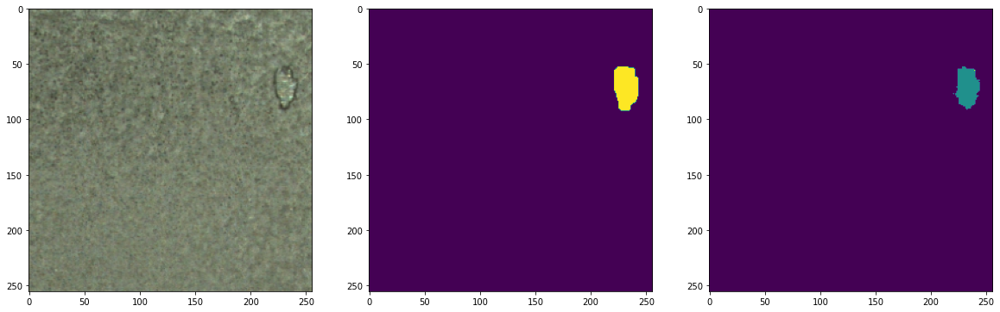

1/1 [==============================] - 0s 76ms/step


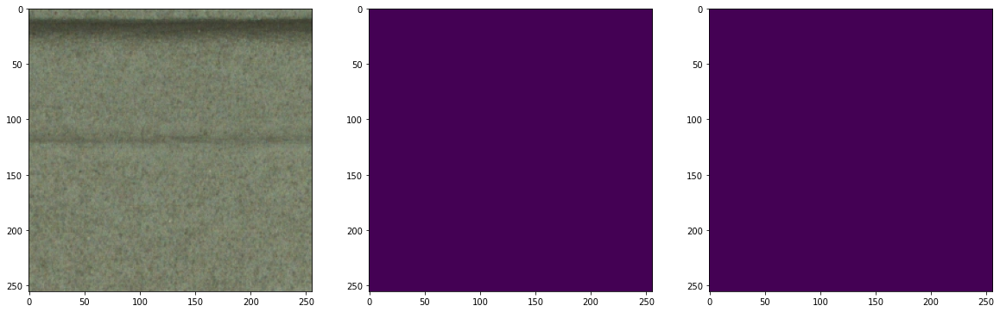

1/1 [==============================] - 0s 98ms/step


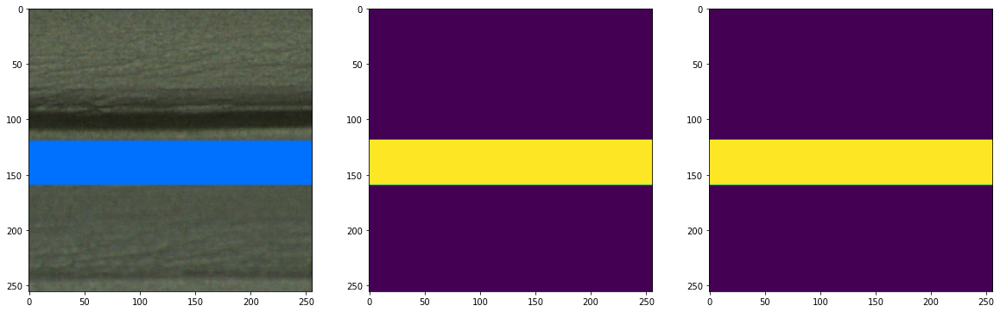

1/1 [==============================] - 0s 77ms/step


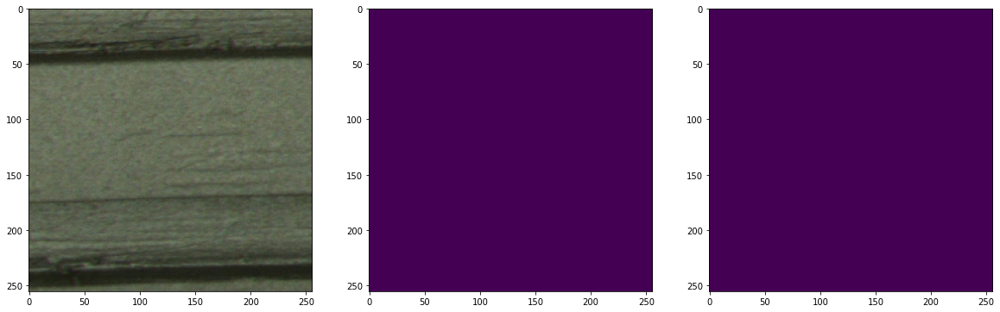

1/1 [==============================] - 0s 90ms/step


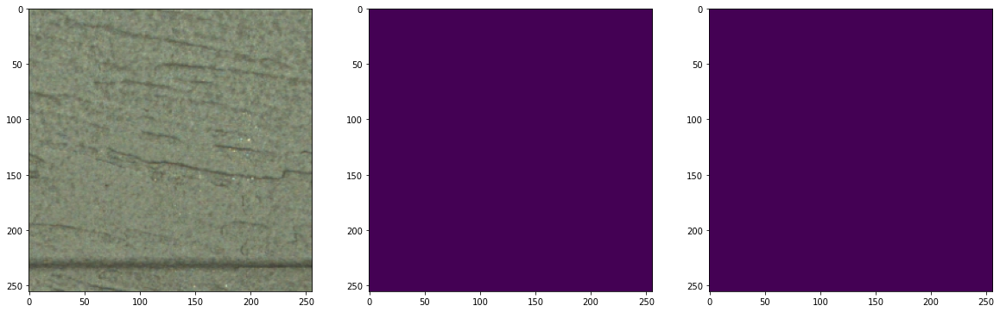

1/1 [==============================] - 0s 92ms/step


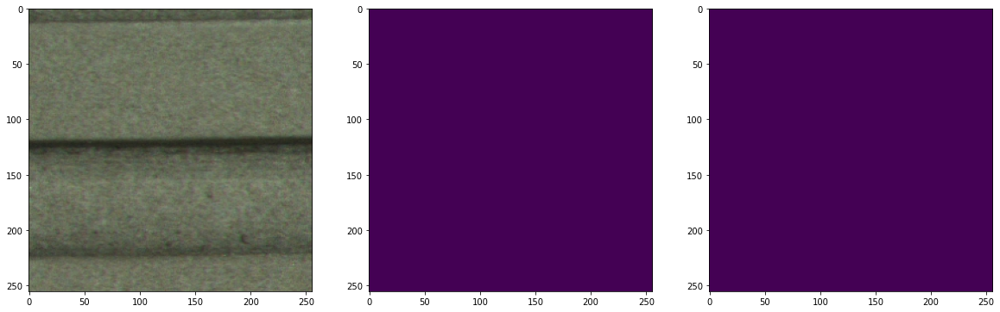

1/1 [==============================] - 0s 89ms/step


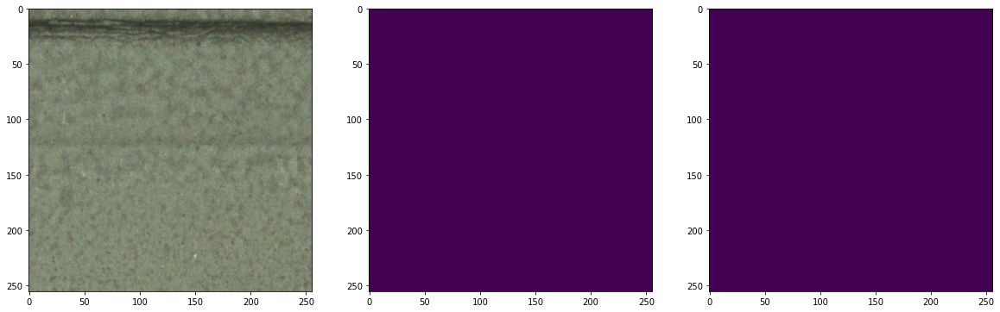

1/1 [==============================] - 0s 77ms/step


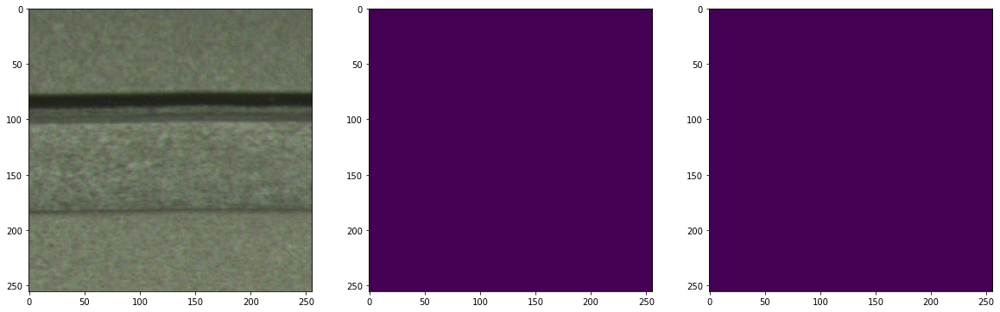

1/1 [==============================] - 0s 76ms/step


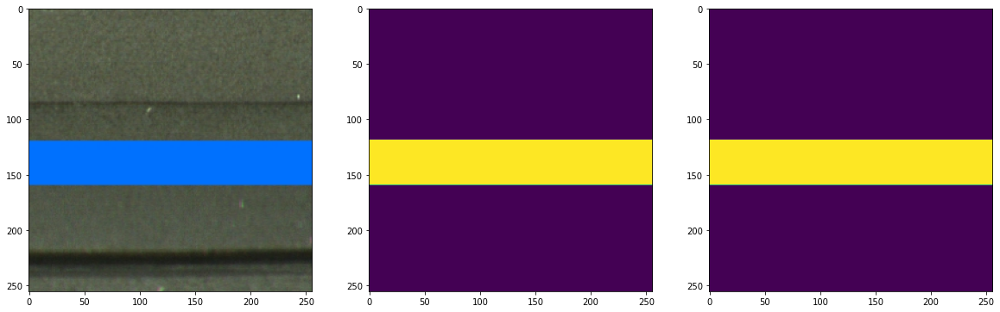

1/1 [==============================] - 0s 76ms/step


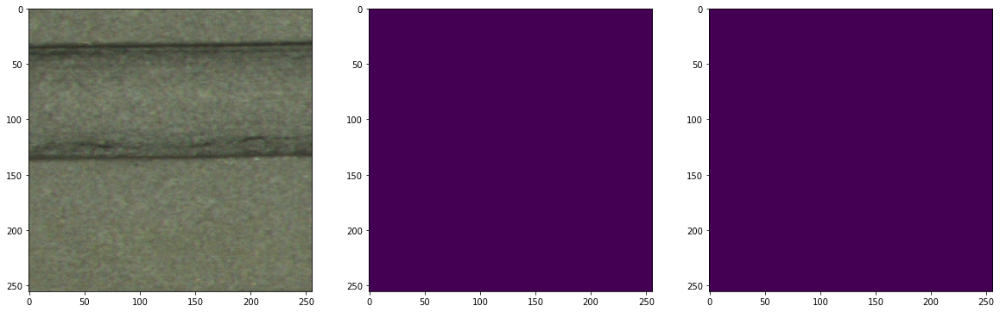

1/1 [==============================] - 0s 90ms/step


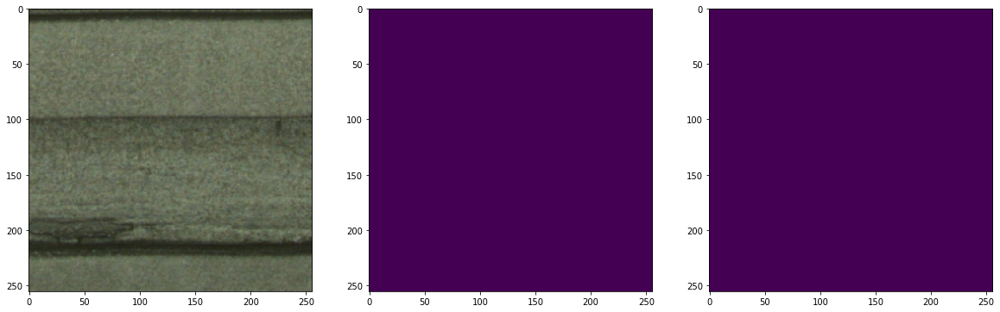

1/1 [==============================] - 0s 90ms/step


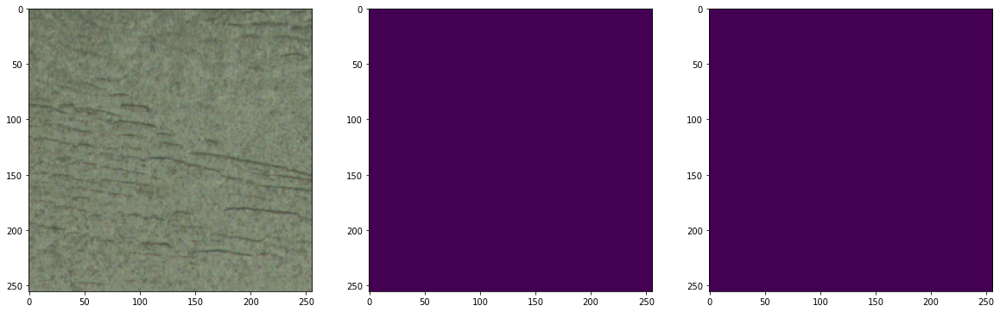

1/1 [==============================] - 0s 79ms/step


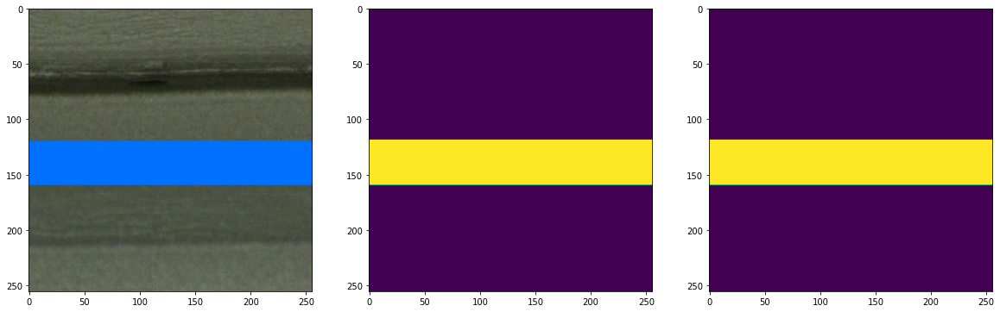

1/1 [==============================] - 0s 78ms/step


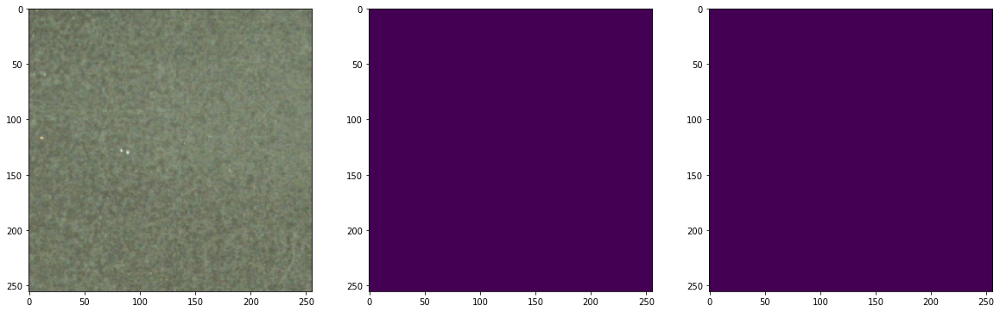

1/1 [==============================] - 0s 74ms/step


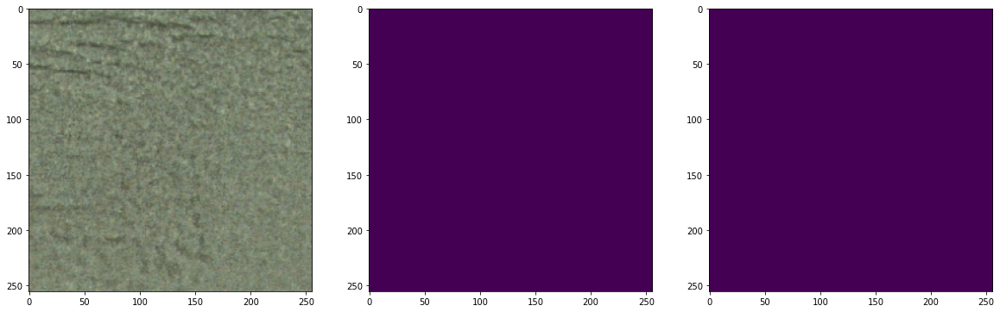

1/1 [==============================] - 0s 80ms/step


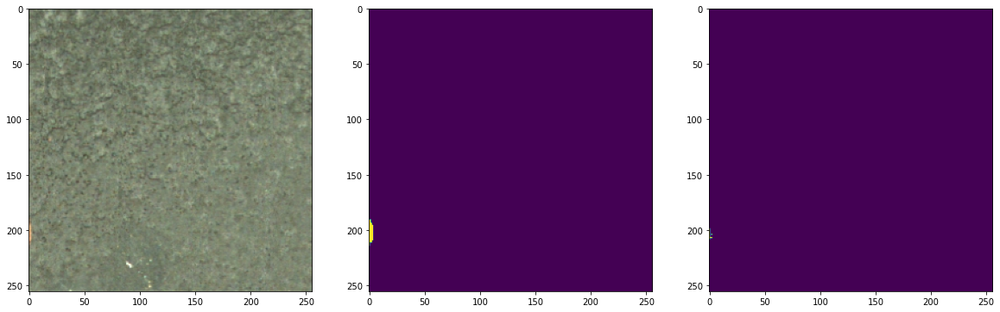

1/1 [==============================] - 0s 91ms/step


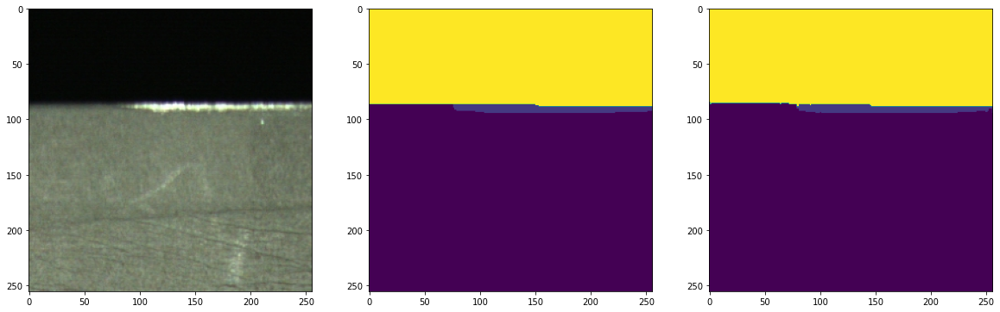

1/1 [==============================] - 0s 95ms/step


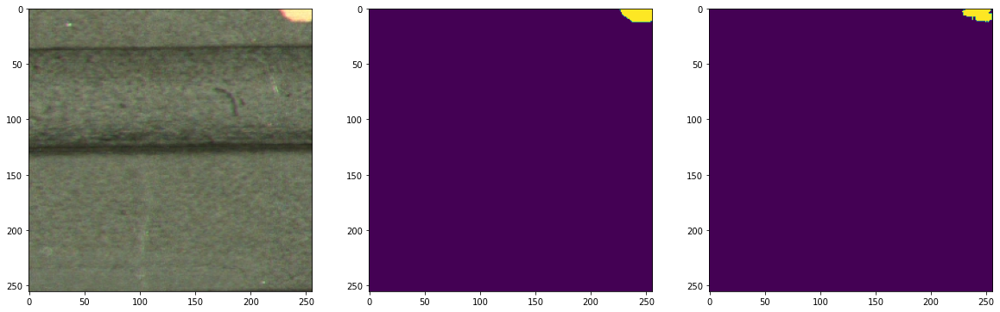

1/1 [==============================] - 0s 79ms/step


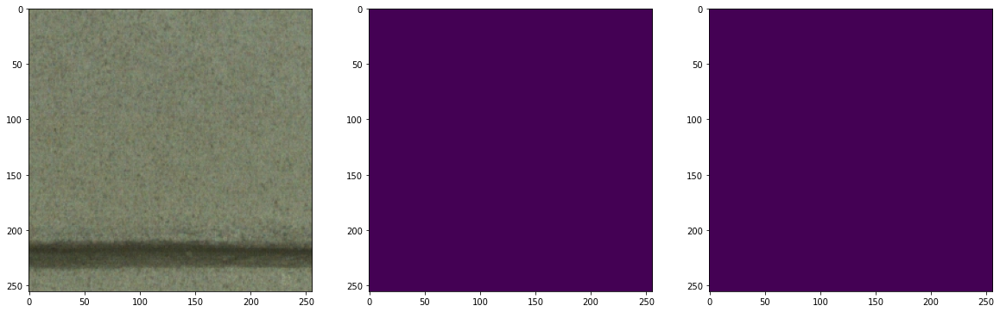

1/1 [==============================] - 0s 79ms/step


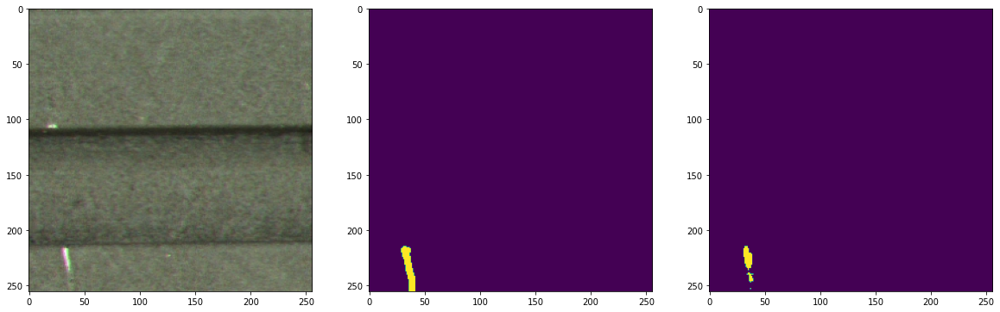

1/1 [==============================] - 0s 81ms/step


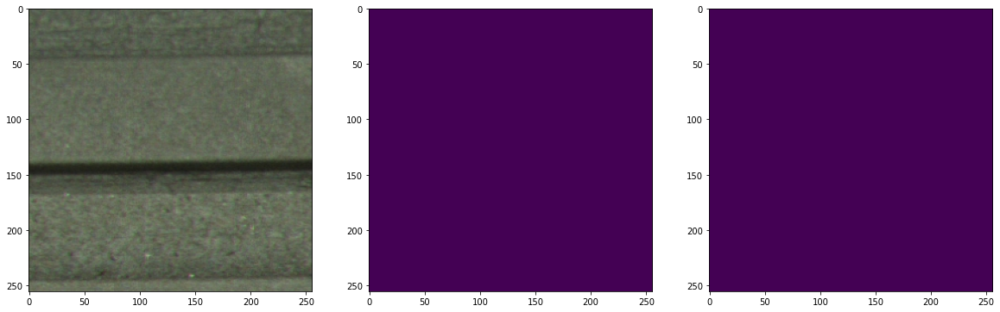

1/1 [==============================] - 0s 77ms/step


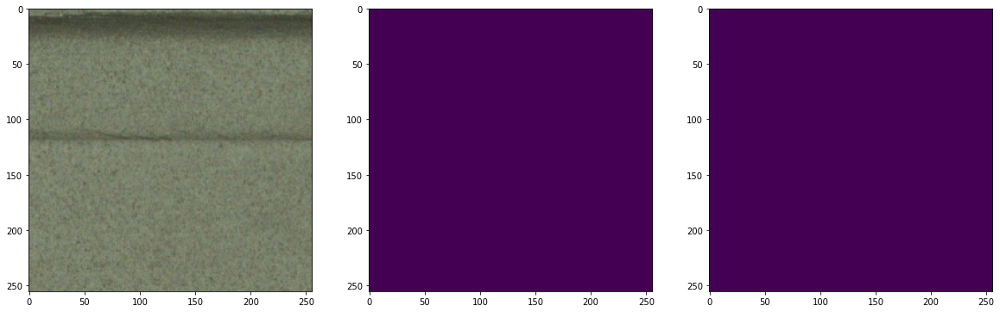

1/1 [==============================] - 0s 83ms/step


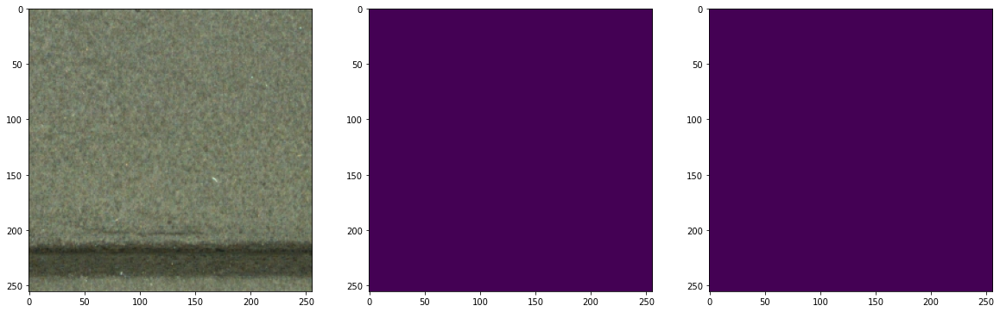

1/1 [==============================] - 0s 91ms/step


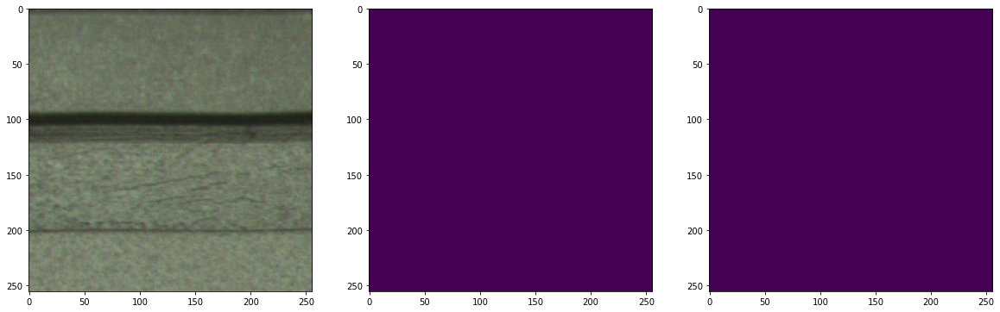

1/1 [==============================] - 0s 82ms/step


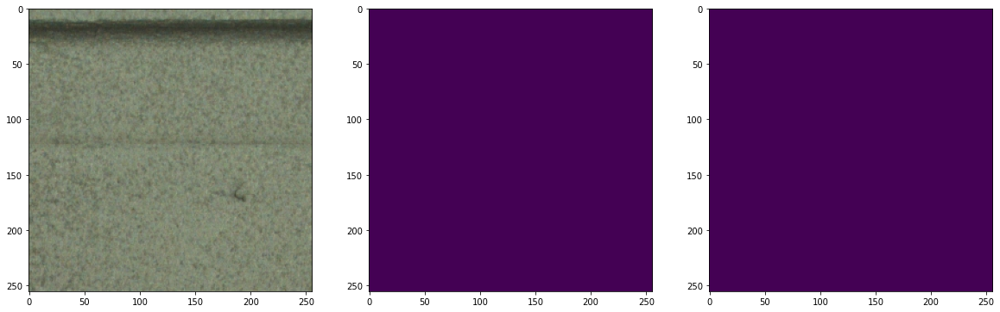

1/1 [==============================] - 0s 89ms/step


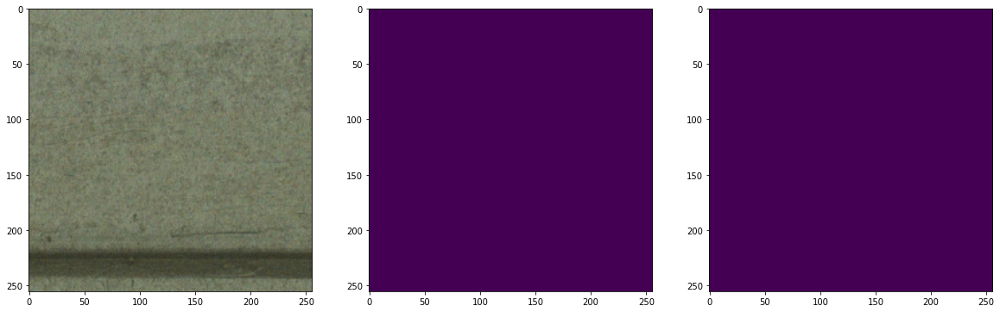

1/1 [==============================] - 0s 89ms/step


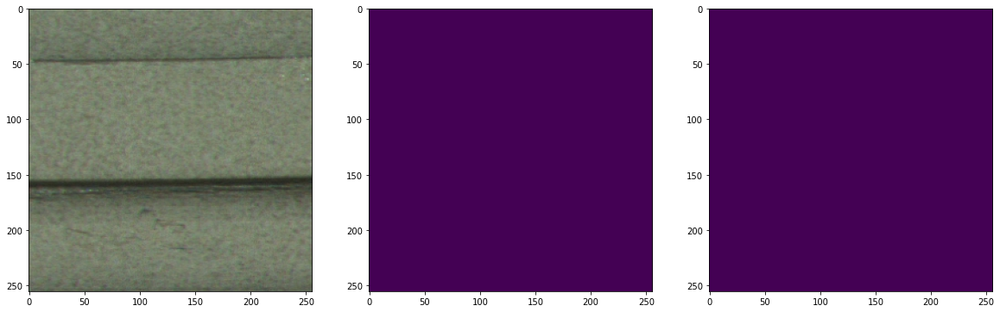

1/1 [==============================] - 0s 84ms/step


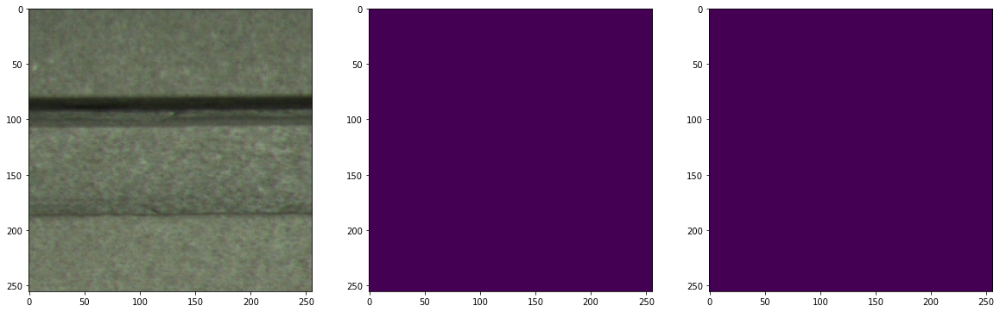

1/1 [==============================] - 0s 83ms/step


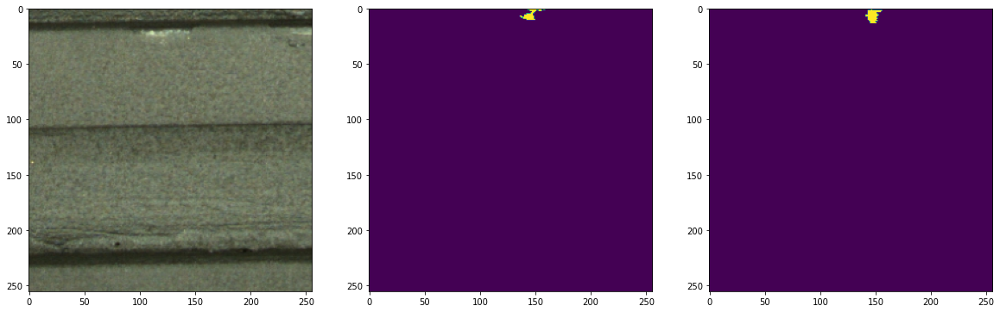

1/1 [==============================] - 0s 78ms/step


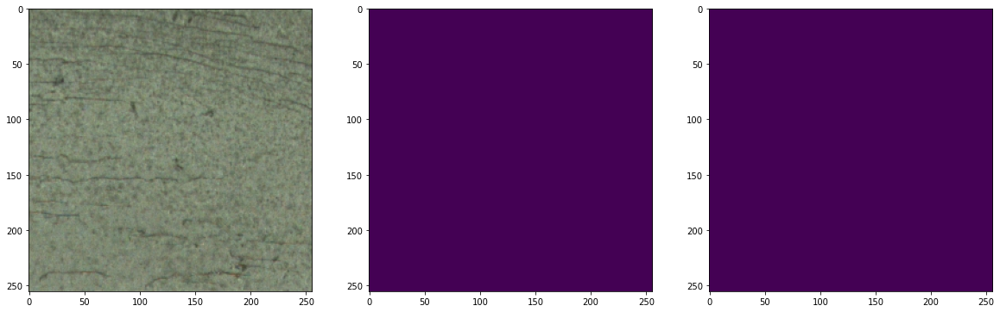

1/1 [==============================] - 0s 75ms/step


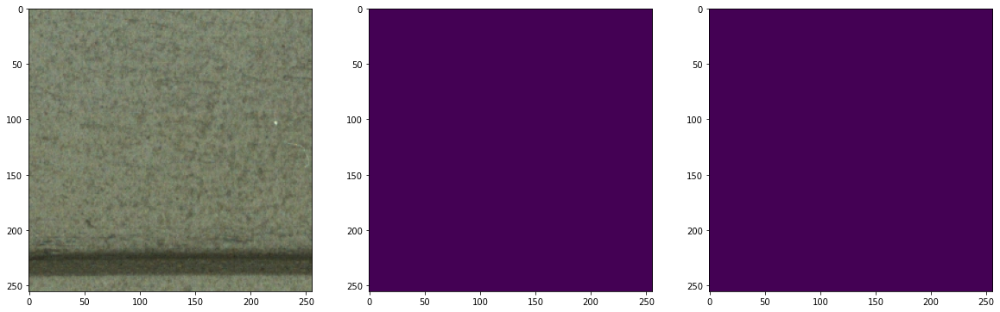

1/1 [==============================] - 0s 76ms/step


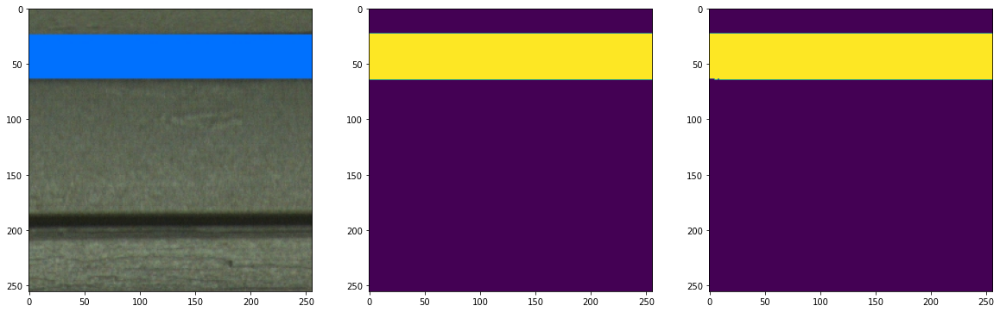

1/1 [==============================] - 0s 74ms/step


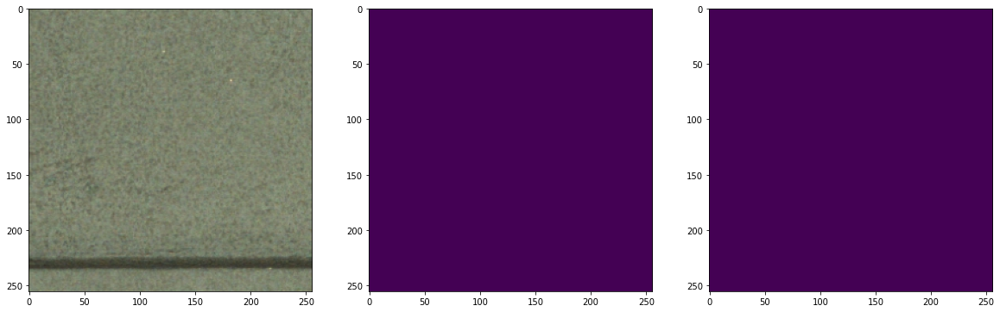

1/1 [==============================] - 0s 77ms/step


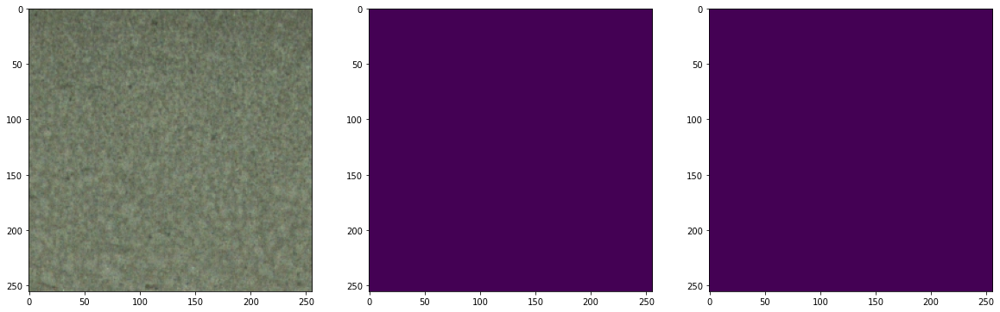

1/1 [==============================] - 0s 84ms/step


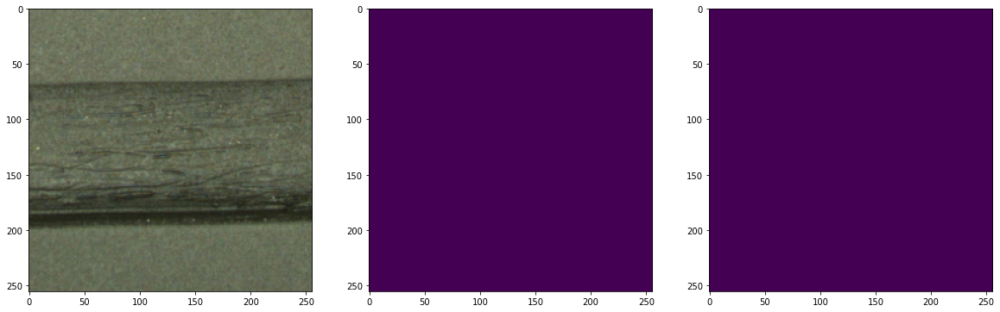

1/1 [==============================] - 0s 77ms/step


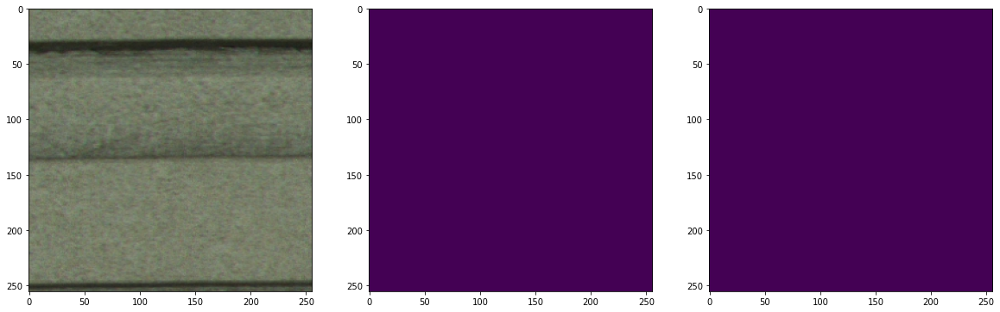

1/1 [==============================] - 0s 82ms/step


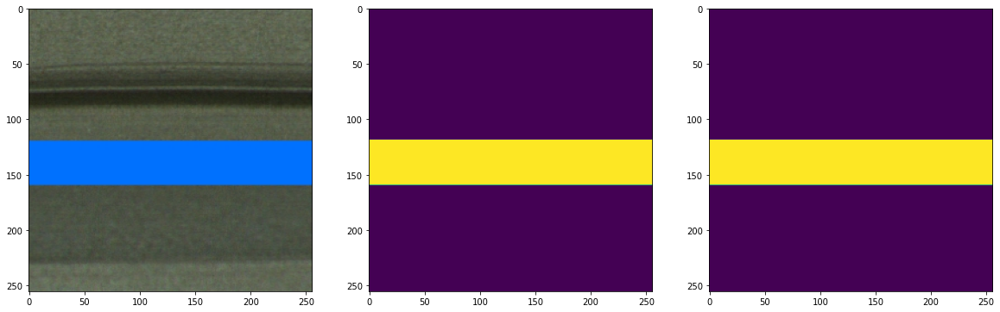

1/1 [==============================] - 0s 88ms/step


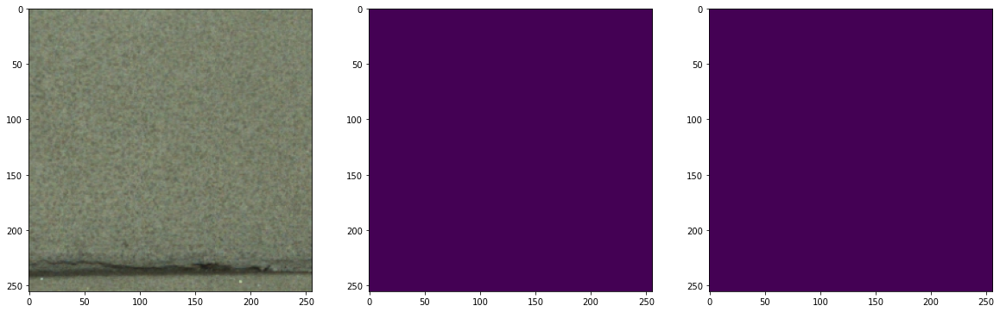

1/1 [==============================] - 0s 75ms/step


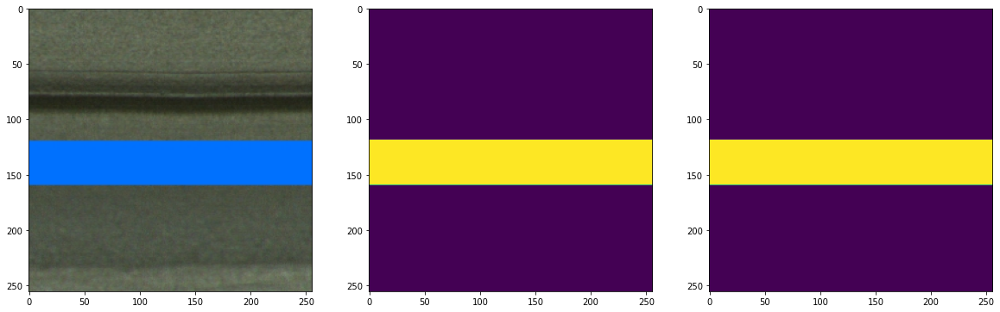

1/1 [==============================] - 0s 85ms/step


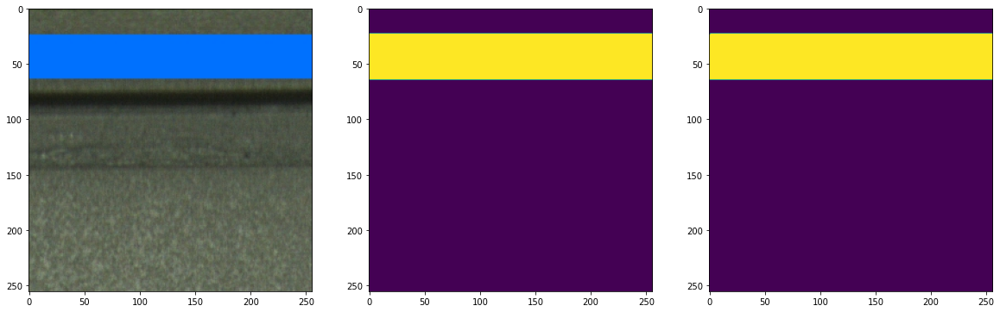

1/1 [==============================] - 0s 94ms/step


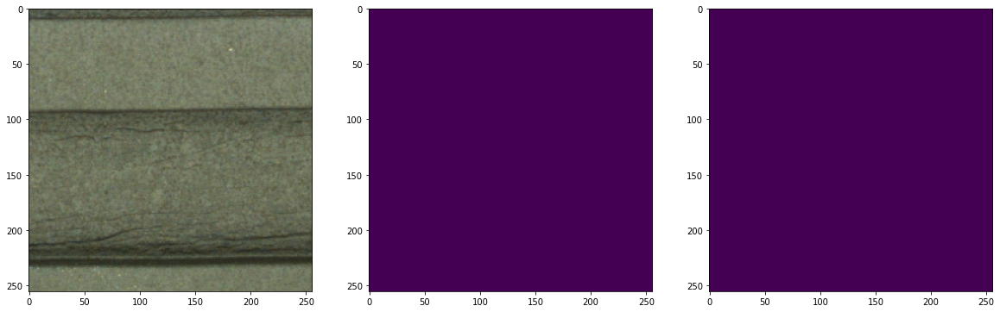

1/1 [==============================] - 0s 88ms/step


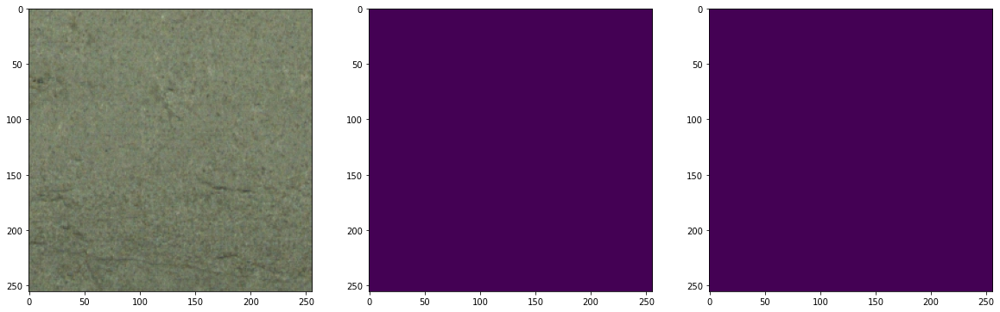

1/1 [==============================] - 0s 76ms/step


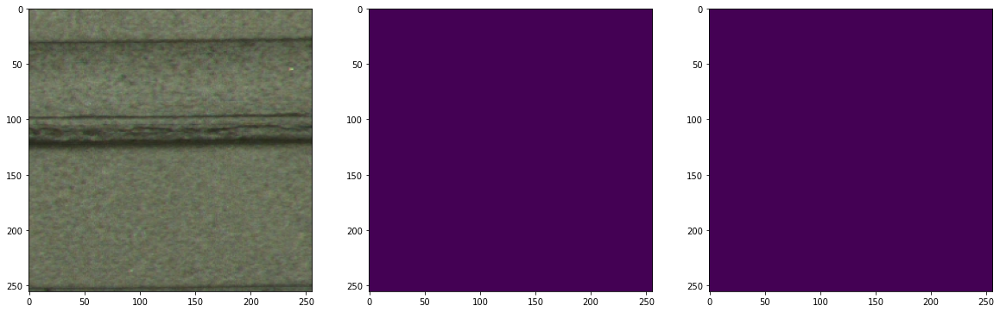

1/1 [==============================] - 0s 73ms/step


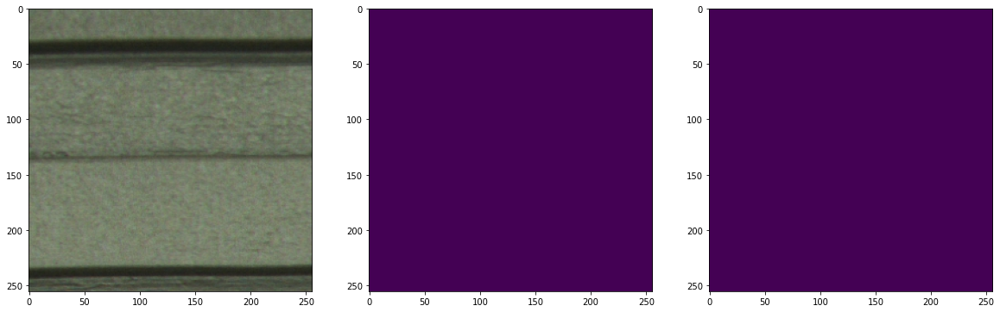

1/1 [==============================] - 0s 73ms/step


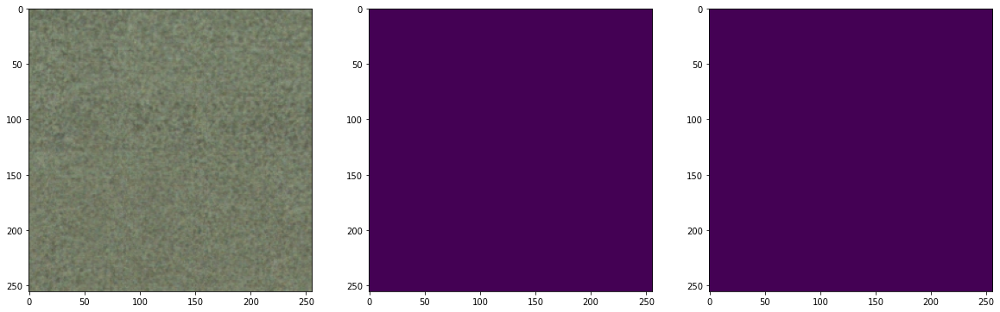

1/1 [==============================] - 0s 80ms/step


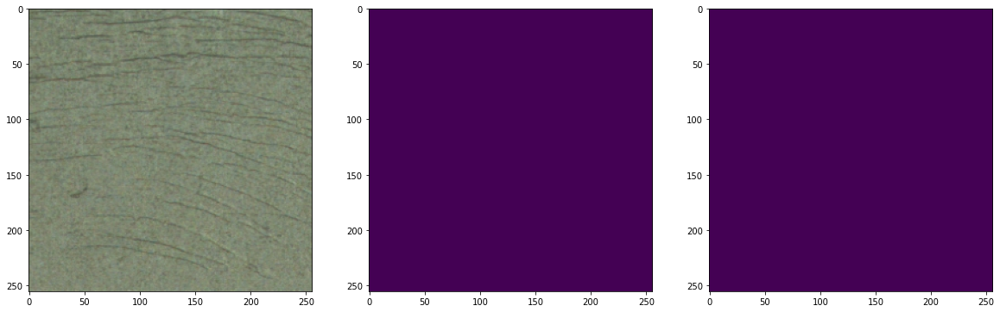

1/1 [==============================] - 0s 73ms/step


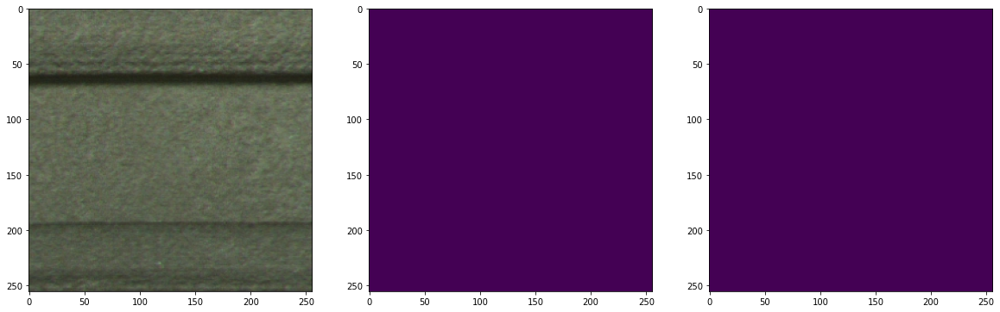

1/1 [==============================] - 0s 74ms/step


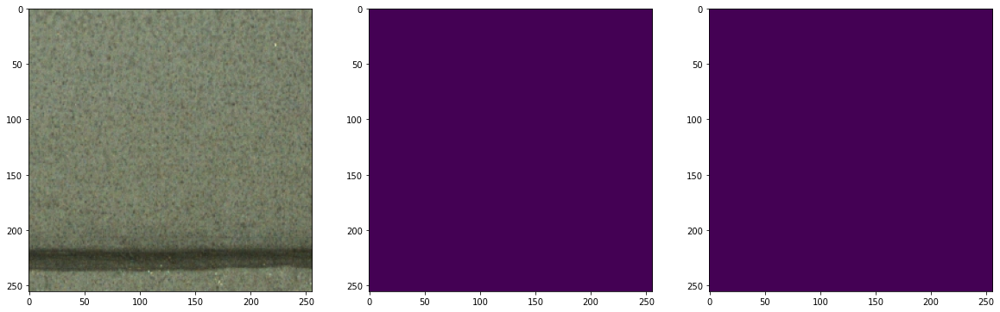

1/1 [==============================] - 0s 77ms/step


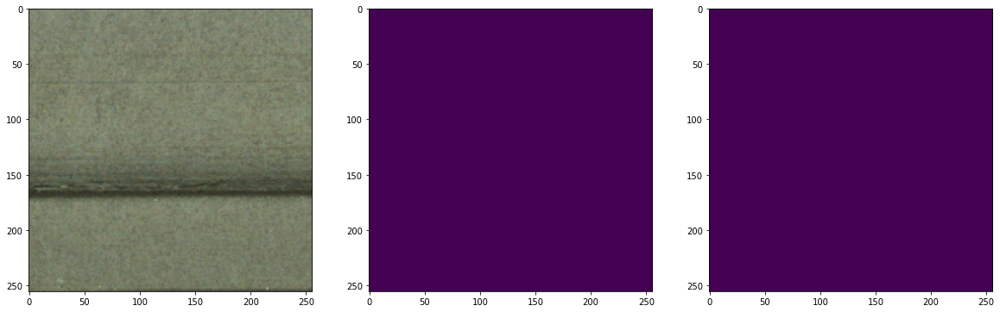

1/1 [==============================] - 0s 75ms/step


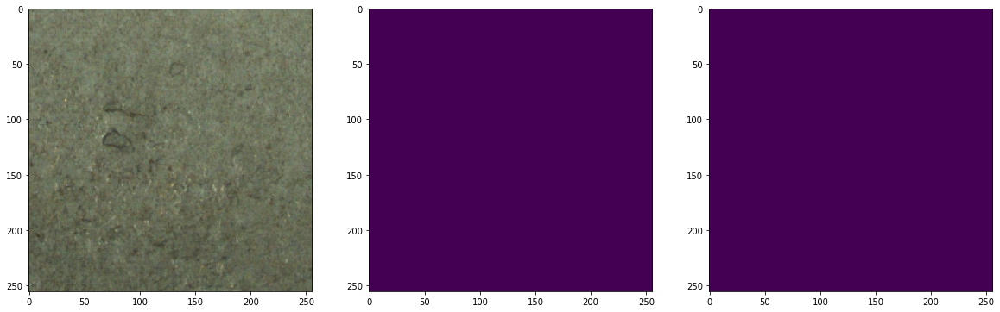

In [55]:
import random

for i in range(50):
    j = random.randint(0, len(mask_dataset))
    
    x = image_dataset[i]
    y = mask_dataset[i]
    
    x_n = x / 255.
    
    x_r = np.reshape(x_n,(-1,256,256,3))
    
    pred = model_class.predict(x_r)
    pred = create_mask(pred)
      
    fig, ax = plt.subplots(1,3, figsize=(20,10))

    ax[0].imshow(x)
    ax[1].imshow(y)
    ax[2].imshow(pred)
    
    plt.show()